In [1]:
import numpy as nm
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import scatter_matrix
from matplotlib import pyplot
import warnings
warnings.filterwarnings("ignore")

#### The dataset for exploration, modeling, interpretability, and explainability is called "Heart Failure Clinical Records Dataset" to be found at the UCI (University California Irvine) Machine Learning Repository.

In [2]:
heart_failure_data = pd.read_csv("heart_failure_clinical_records_dataset.csv")

### Perform Explanatory Data Analysis (EDA). Indicate how features correlate among themselves, with emphasis to the target / label one.

In [3]:
heart_failure_data.shape

(299, 13)

In [4]:
heart_failure_data.columns

Index(['age', 'anaemia', 'creatinine_phosphokinase', 'diabetes',
       'ejection_fraction', 'high_blood_pressure', 'platelets',
       'serum_creatinine', 'serum_sodium', 'sex', 'smoking', 'time',
       'DEATH_EVENT'],
      dtype='object')

In [5]:
heart_failure_data["DEATH_EVENT"].value_counts()

DEATH_EVENT
0    203
1     96
Name: count, dtype: int64

In [6]:
heart_failure_data

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
0,75.0,0,582,0,20,1,265000.00,1.9,130,1,0,4,1
1,55.0,0,7861,0,38,0,263358.03,1.1,136,1,0,6,1
2,65.0,0,146,0,20,0,162000.00,1.3,129,1,1,7,1
3,50.0,1,111,0,20,0,210000.00,1.9,137,1,0,7,1
4,65.0,1,160,1,20,0,327000.00,2.7,116,0,0,8,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
294,62.0,0,61,1,38,1,155000.00,1.1,143,1,1,270,0
295,55.0,0,1820,0,38,0,270000.00,1.2,139,0,0,271,0
296,45.0,0,2060,1,60,0,742000.00,0.8,138,0,0,278,0
297,45.0,0,2413,0,38,0,140000.00,1.4,140,1,1,280,0


In [7]:
heart_failure_data.describe().T

,count,mean,std,min,25%,50%,75%,max
age,299.0,60.833893,11.894809,40.0,51.0,60.0,70.0,95.0
anaemia,299.0,0.431438,0.496107,0.0,0.0,0.0,1.0,1.0
creatinine_phosphokinase,299.0,581.839465,970.287881,23.0,116.5,250.0,582.0,7861.0
diabetes,299.0,0.418060,0.494067,0.0,0.0,0.0,1.0,1.0
ejection_fraction,299.0,38.083612,11.834841,14.0,30.0,38.0,45.0,80.0
high_blood_pressure,299.0,0.351171,0.478136,0.0,0.0,0.0,1.0,1.0
platelets,299.0,263358.029264,97804.236869,25100.0,212500.0,262000.0,303500.0,850000.0
serum_creatinine,299.0,1.393880,1.034510,0.5,0.9,1.1,1.4,9.4
serum_sodium,299.0,136.625418,4.412477,113.0,134.0,137.0,140.0,148.0
sex,299.0,0.648829,0.478136,0.0,0.0,1.0,1.0,1.0


In [8]:
print(heart_failure_data.isnull().any())

age                         False
anaemia                     False
creatinine_phosphokinase    False
diabetes                    False
ejection_fraction           False
high_blood_pressure         False
platelets                   False
serum_creatinine            False
serum_sodium                False
sex                         False
smoking                     False
time                        False
DEATH_EVENT                 False
dtype: bool


In [9]:
heart_failure_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299 entries, 0 to 298
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       299 non-null    float64
 1   anaemia                   299 non-null    int64  
 2   creatinine_phosphokinase  299 non-null    int64  
 3   diabetes                  299 non-null    int64  
 4   ejection_fraction         299 non-null    int64  
 5   high_blood_pressure       299 non-null    int64  
 6   platelets                 299 non-null    float64
 7   serum_creatinine          299 non-null    float64
 8   serum_sodium              299 non-null    int64  
 9   sex                       299 non-null    int64  
 10  smoking                   299 non-null    int64  
 11  time                      299 non-null    int64  
 12  DEATH_EVENT               299 non-null    int64  
dtypes: float64(3), int64(10)
memory usage: 30.5 KB


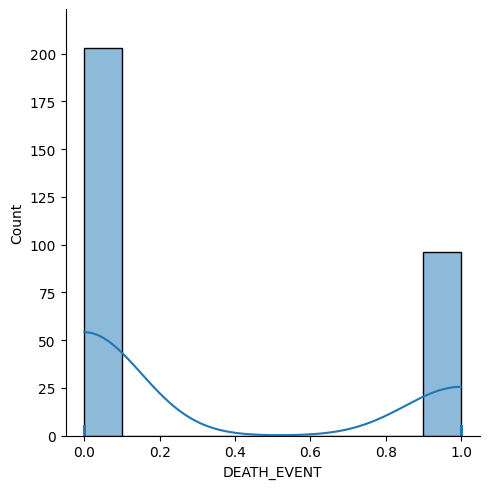

In [10]:
sns.displot(heart_failure_data["DEATH_EVENT"], kde = True, rug = True)
plt.show()

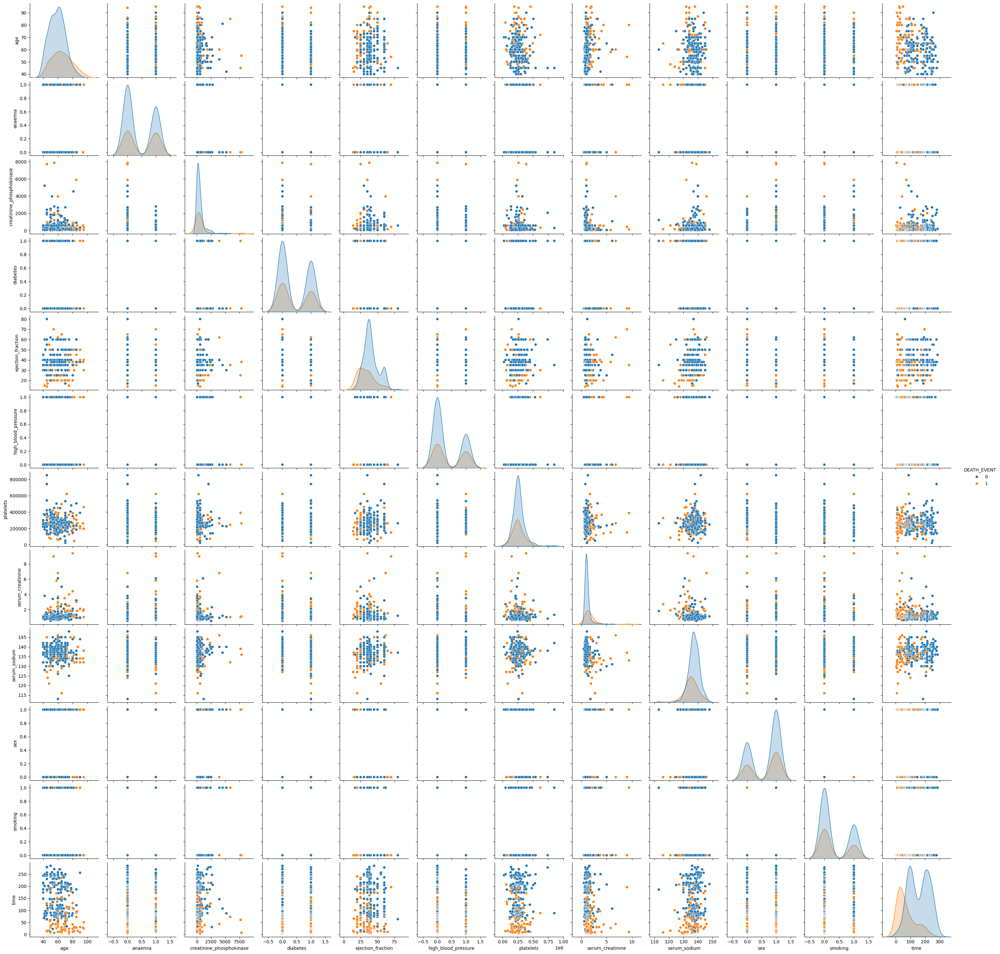

In [11]:
sns.pairplot(heart_failure_data, hue = "DEATH_EVENT")

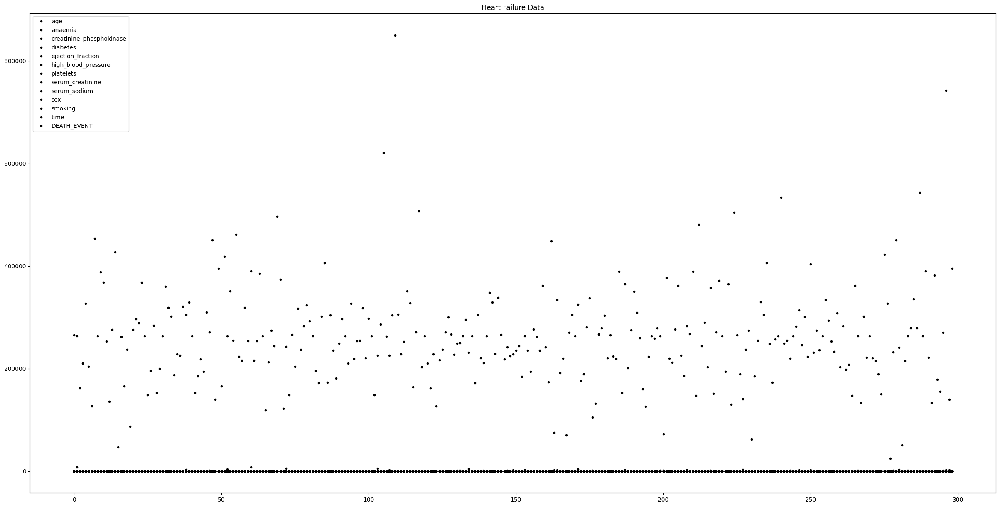

In [12]:
heart_failure_data.plot(style = "k.", figsize = (30, 15),
                         title = "Heart Failure Data")
plt.show()

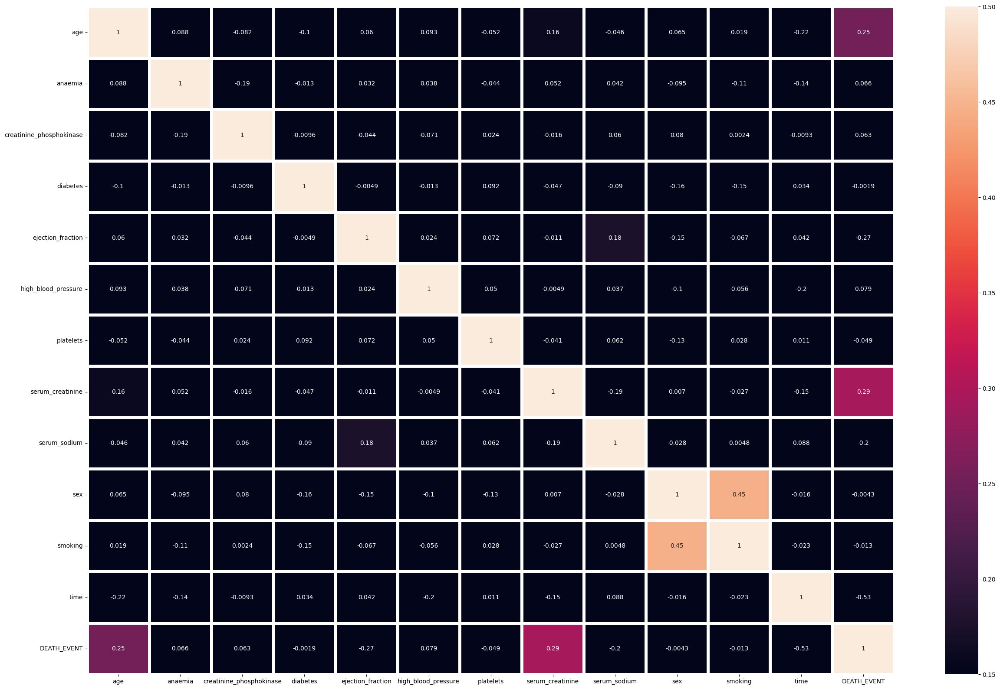

In [13]:
plt.figure(figsize = (30, 20))
sns.heatmap(heart_failure_data.corr(), linewidths = 5, vmin = 0.15, vmax = 0.5, annot = True)
plt.yticks(rotation = 0);

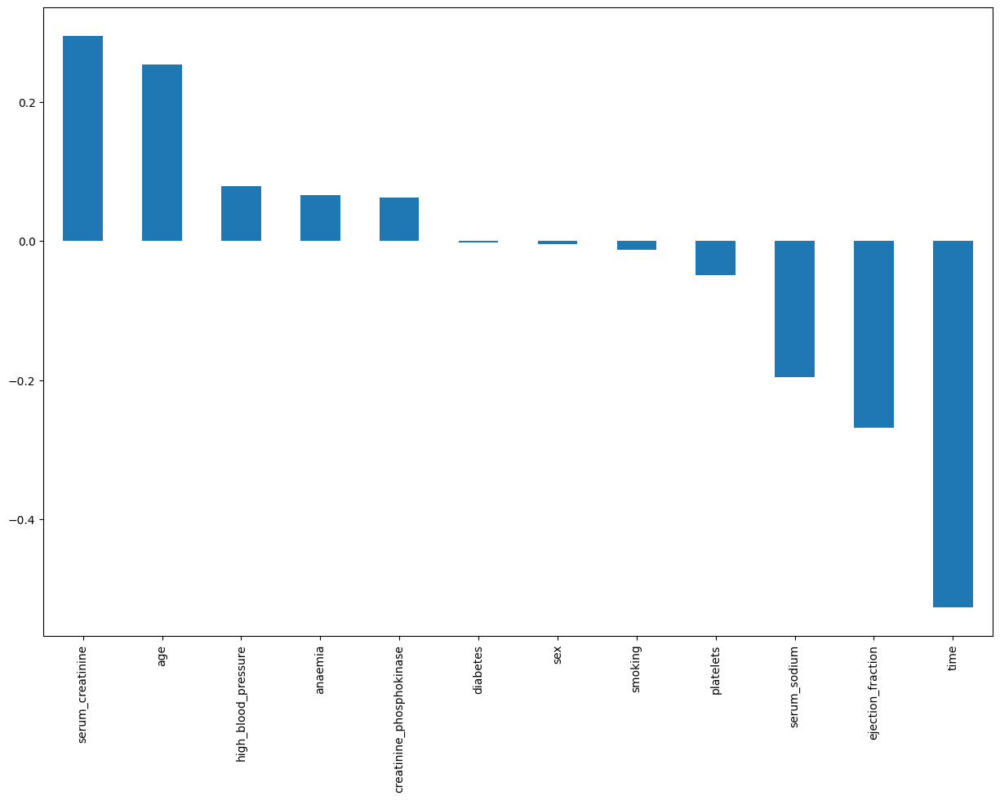

In [14]:
plt.figure(figsize = (15, 10))
heart_failure_data.corr()["DEATH_EVENT"].sort_values(ascending = False)[1:].plot(kind = "bar");

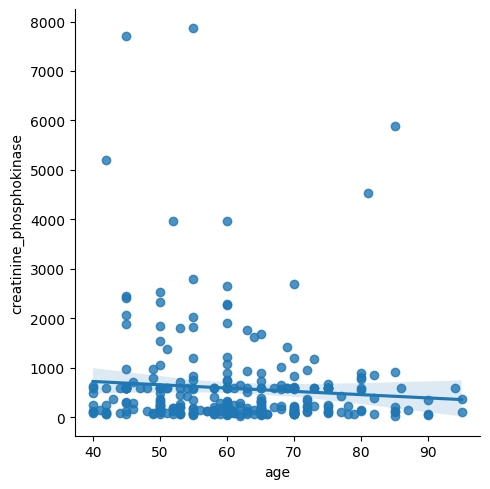

In [15]:
sns.lmplot(x = "age", y = "creatinine_phosphokinase", data = heart_failure_data)

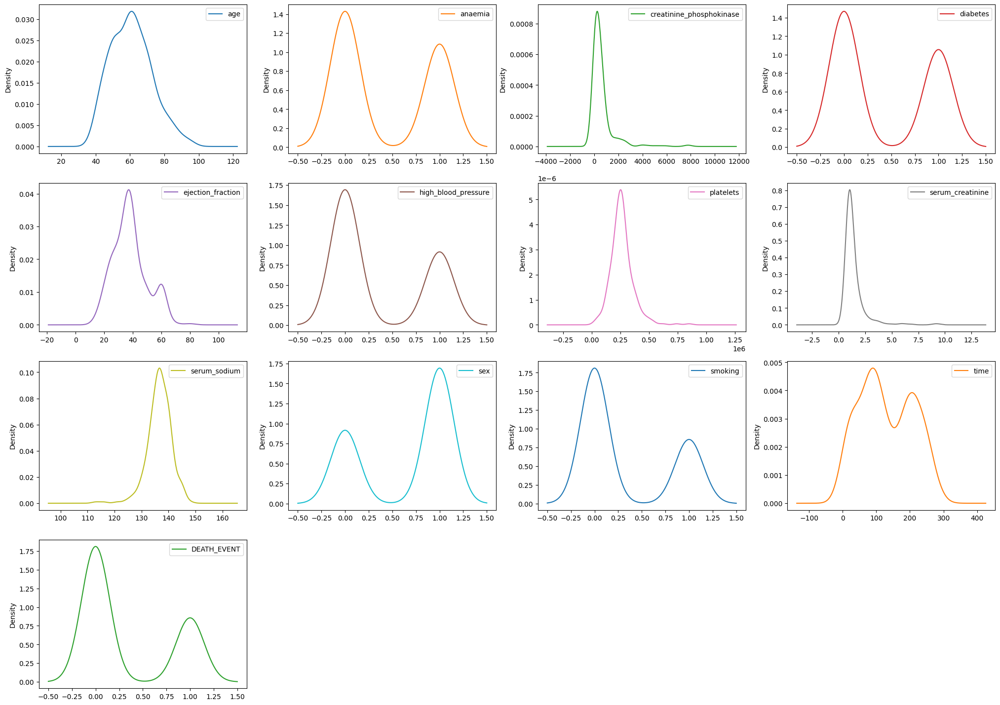

In [16]:
fig = plt.figure(figsize = (25, 18))
ax = fig.gca()
heart_failure_data.plot(kind = "density", subplots = True, layout = (4, 4), sharex = False, ax = ax)
plt.show()

### Apply ML Modeling on the dataset using the below 4 algorithms. Tune (hyper-parameter tuning) each model by calling the GridSearchCV method.

In [17]:
from sklearn import metrics
from sklearn.datasets import make_classification
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, precision_recall_curve
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, classification_report
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

scaler = StandardScaler()
lr = LogisticRegression()
dt = DecisionTreeClassifier()
rf = RandomForestClassifier()
xgb = XGBClassifier()

In [18]:
hfd = heart_failure_data.copy()

X = hfd.drop(columns = ["DEATH_EVENT"])
y = hfd["DEATH_EVENT"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, stratify = hfd["DEATH_EVENT"], random_state = 0)

In [19]:
numerics = ['int8', 'int16', 'int32', 'int64', 'float16', 'float32', 'float64']
categorical_columns = []
features = hfd.columns.values.tolist()
for col in features:
    if hfd[col].dtype in numerics: continue
    categorical_columns.append(col)

for col in categorical_columns:
    if col in hfd.columns:
        le = LabelEncoder()
        le.fit(list(hfd[col].astype(str).values))
        hfd[col] = le.transform(list(hfd[col].astype(str).values))
hfd

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
0,75.0,0,582,0,20,1,265000.00,1.9,130,1,0,4,1
1,55.0,0,7861,0,38,0,263358.03,1.1,136,1,0,6,1
2,65.0,0,146,0,20,0,162000.00,1.3,129,1,1,7,1
3,50.0,1,111,0,20,0,210000.00,1.9,137,1,0,7,1
4,65.0,1,160,1,20,0,327000.00,2.7,116,0,0,8,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
294,62.0,0,61,1,38,1,155000.00,1.1,143,1,1,270,0
295,55.0,0,1820,0,38,0,270000.00,1.2,139,0,0,271,0
296,45.0,0,2060,1,60,0,742000.00,0.8,138,0,0,278,0
297,45.0,0,2413,0,38,0,140000.00,1.4,140,1,1,280,0


In [20]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(239, 12)
(60, 12)
(239,)
(60,)


In [21]:
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

### Logistic Regression (LR)

In [22]:
lr.fit(X_train, y_train)
lr_pred = lr.predict(X_test)

#### Evaluating the Model

In [23]:
print("Logistic Regression Testing Data:")
print(f"Precision Score: {round(precision_score(y_test, lr_pred), 2)}")
print(f"F1 Score: {round(f1_score(y_test, lr_pred), 2)}")
print(f"Recall Score: {round(recall_score(y_test, lr_pred), 2)}")
print(f"Accuracy Score: {round(accuracy_score(y_test, lr_pred), 2)}")
print(f"ROC-AUC Score: {round(roc_auc_score(y_test, lr_pred), 2)}")

Logistic Regression Testing Data:
Precision Score: 0.87
F1 Score: 0.76
Recall Score: 0.68
Accuracy Score: 0.87
ROC-AUC Score: 0.82


In [24]:
print("Logistic Regression \nConfusion Matrix: \n", confusion_matrix(y_test, lr_pred))

Logistic Regression 
Confusion Matrix: 
 [[39  2]
 [ 6 13]]


In [25]:
print("Logistic Regression \nClassification Matrix: \n", classification_report(y_test, lr_pred))

Logistic Regression 
Classification Matrix: 
               precision    recall  f1-score   support

           0       0.87      0.95      0.91        41
           1       0.87      0.68      0.76        19

    accuracy                           0.87        60
   macro avg       0.87      0.82      0.84        60
weighted avg       0.87      0.87      0.86        60



### Decision Tree (DT)

In [26]:
dt.fit(X_train, y_train)
dt_pred = dt.predict(X_test)

#### Evaluating the Model

In [27]:
print("Decision Tree Testing Data:")
print(f"Precision Score: {round(precision_score(y_test, dt_pred), 2)}")
print(f"F1 Score: {round(f1_score(y_test, dt_pred), 2)}")
print(f"Recall Score: {round(recall_score(y_test, dt_pred), 2)}")
print(f"Accuracy Score: {round(accuracy_score(y_test, dt_pred), 2)}")
print(f"ROC-AUC Score: {round(roc_auc_score(y_test, dt_pred), 2)}")

Decision Tree Testing Data:
Precision Score: 0.68
F1 Score: 0.77
Recall Score: 0.89
Accuracy Score: 0.83
ROC-AUC Score: 0.85


In [28]:
print("Decision Tree \nConfusion Matrix: \n", confusion_matrix(y_test, dt_pred))

Decision Tree 
Confusion Matrix: 
 [[33  8]
 [ 2 17]]


In [29]:
print("Decision Tree \nClassification Matrix: \n", classification_report(y_test, dt_pred))

Decision Tree 
Classification Matrix: 
               precision    recall  f1-score   support

           0       0.94      0.80      0.87        41
           1       0.68      0.89      0.77        19

    accuracy                           0.83        60
   macro avg       0.81      0.85      0.82        60
weighted avg       0.86      0.83      0.84        60



### Random Forest (RF)

In [30]:
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)

#### Evaluating the Model

In [31]:
print("Random Forest:")
print(f"Precision Score: {round(precision_score(y_test, rf_pred), 2)}")
print(f"F1 Score: {round(f1_score(y_test, rf_pred), 2)}")
print(f"Recall Score: {round(recall_score(y_test, rf_pred), 2)}")
print(f"Accuracy Score: {round(accuracy_score(y_test, rf_pred), 2)}")
print(f"ROC-AUC Score: {round(roc_auc_score(y_test, rf_pred), 2)}")

Random Forest:
Precision Score: 0.79
F1 Score: 0.79
Recall Score: 0.79
Accuracy Score: 0.87
ROC-AUC Score: 0.85


In [32]:
print("Random Forest \nConfusion Matrix: \n", confusion_matrix(y_test, rf_pred))

Random Forest 
Confusion Matrix: 
 [[37  4]
 [ 4 15]]


In [33]:
print("Random Forest \nClassification Matrix: \n", classification_report(y_test, rf_pred))

Random Forest 
Classification Matrix: 
               precision    recall  f1-score   support

           0       0.90      0.90      0.90        41
           1       0.79      0.79      0.79        19

    accuracy                           0.87        60
   macro avg       0.85      0.85      0.85        60
weighted avg       0.87      0.87      0.87        60



### XGBoost (XGB)

In [34]:
xgb.fit(X_train, y_train, eval_metric = "logloss")
xgb_pred = xgb.predict(X_test)

#### Evaluating the Model

In [35]:
print("XGBoost:")
print(f"Precision Score: {round(precision_score(y_test, xgb_pred), 2)}")
print(f"F1 Score: {round(f1_score(y_test, xgb_pred), 2)}")
print(f"Recall Score: {round(recall_score(y_test, xgb_pred), 2)}")
print(f"Accuracy Score: {round(accuracy_score(y_test, xgb_pred), 2)}")
print(f"ROC-AUC Score: {round(roc_auc_score(y_test, xgb_pred), 2)}")

XGBoost:
Precision Score: 0.7
F1 Score: 0.72
Recall Score: 0.74
Accuracy Score: 0.82
ROC-AUC Score: 0.8


In [36]:
print("XGBoost \nConfusion Matrix: \n", confusion_matrix(y_test, xgb_pred))

XGBoost 
Confusion Matrix: 
 [[35  6]
 [ 5 14]]


In [37]:
print("XGBoost \nClassification Matrix: \n", classification_report(y_test, xgb_pred))

XGBoost 
Classification Matrix: 
               precision    recall  f1-score   support

           0       0.88      0.85      0.86        41
           1       0.70      0.74      0.72        19

    accuracy                           0.82        60
   macro avg       0.79      0.80      0.79        60
weighted avg       0.82      0.82      0.82        60



### Comparing Model (Pre-GridSearch)

LR 0.7993143459915611
DT 0.7863396624472574
RF 0.8327004219409283
XGB 0.8327531645569621
[array([0.7875    , 0.775     , 0.83544304]), array([0.85      , 0.7875    , 0.72151899]), array([0.8125    , 0.8375    , 0.84810127]), array([0.8       , 0.8375    , 0.86075949])]


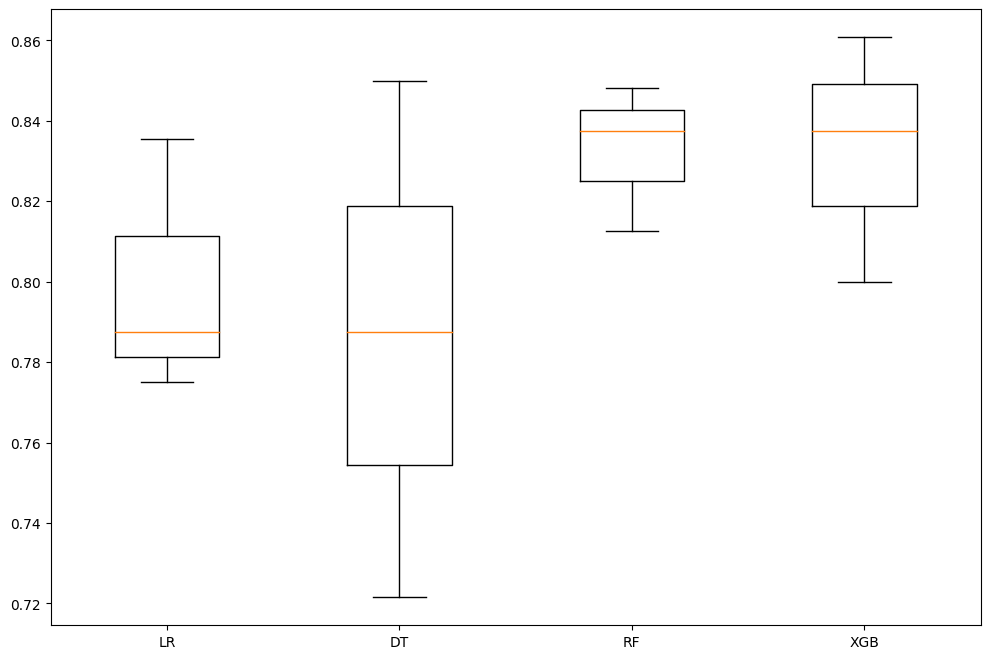

In [38]:
models = []

def classification_Models(X_train, X_test, y_train, y_test):

    models.append(("LR", LogisticRegression()))
    models.append(("DT", DecisionTreeClassifier()))
    models.append(("RF", RandomForestClassifier()))
    models.append(("XGB", XGBClassifier()))
    modeloutcomes = []
    modelnames = []

    for name, model in models:
        v_results = cross_val_score(model, X_train, y_train, cv = 3, scoring = "accuracy", n_jobs = -1, verbose = 0)
        print(name, v_results.mean())
        modeloutcomes.append(v_results)
        modelnames.append(name)

    print(modeloutcomes)
    fig = plt.figure(figsize = (12, 8))
    ax = fig.add_subplot(111)
    ax.set_xticklabels(modelnames)
    plt.boxplot(modeloutcomes)


classification_Models(X_train, X_test, y_train, y_test)

LR 0.8537226970560304
DT 0.7335897435897435
RF 0.883988603988604
XGB 0.8864767331433998
[array([0.8468661 , 0.84615385, 0.86814815]), array([0.79059829, 0.77350427, 0.63666667]), array([0.83867521, 0.88069801, 0.93259259]), array([0.86253561, 0.87393162, 0.92296296])]


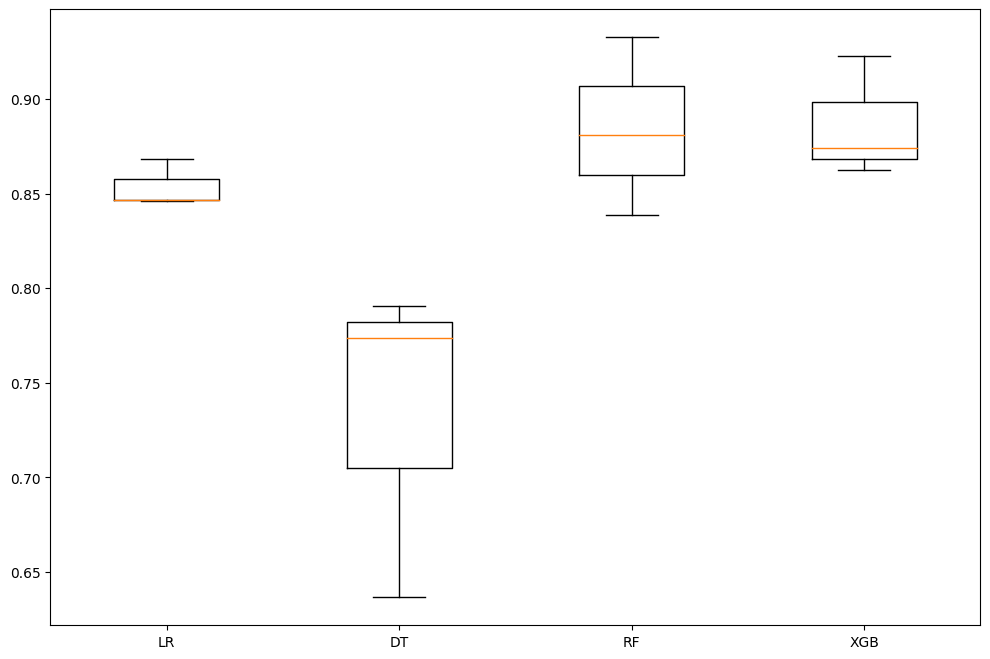

In [39]:
models = []

def classification_Models(X_train, X_test, y_train, y_test):

    models.append(("LR", LogisticRegression()))
    models.append(("DT", DecisionTreeClassifier()))
    models.append(("RF", RandomForestClassifier()))
    models.append(("XGB", XGBClassifier()))

    modeloutcomes = []
    modelnames = []
    for name, model in models:
        v_results = cross_val_score(model, X_train, y_train, cv = 3, scoring = "roc_auc", n_jobs = -1, verbose = 0)
        print(name, v_results.mean())
        modeloutcomes.append(v_results)
        modelnames.append(name)

    print(modeloutcomes)
    fig = plt.figure(figsize = (12, 8))
    ax = fig.add_subplot(111)
    ax.set_xticklabels(modelnames)
    plt.boxplot(modeloutcomes)

classification_Models(X_train, X_test, y_train, y_test)

### Hypertuning with GridSearch

#### Logistic Regression

In [40]:
lr_params = [{"solver": ["newton_cg", "lbfgs", "liblinear", "sag", "saga"]},
              {"penalty": ["l1" "l2", "elasticnet", "none"]},
              {"multi_class": ["uto" "vr" "multinomial"]},
              {"C": [0.001, 0.01, 0.1, 1, 10, 100]}]
lr_grid = GridSearchCV(estimator = LogisticRegression(), param_grid = lr_params, cv = 5, verbose = 4, n_jobs = 5)

In [41]:
lr_grid.fit(X_train, y_train)
lr_grid.best_params_

Fitting 5 folds for each of 15 candidates, totalling 75 fits


{'C': 0.1}

#### Decision Tree

In [42]:
dt_params = {"criterion": ["gini", "entropy"],
             "splitter": ["best", "random"],
             "max_depth": [1, 2, 3, 4, 5],
             "random_state": [1, 2, 3, 4, 5]}
dt_grid = GridSearchCV(estimator = DecisionTreeClassifier(), param_grid = dt_params, cv = 3, verbose = 1, n_jobs = -1)

In [43]:
dt_grid.fit(X_train, y_train)
dt_grid.best_params_

Fitting 3 folds for each of 100 candidates, totalling 300 fits


{'criterion': 'gini', 'max_depth': 1, 'random_state': 1, 'splitter': 'best'}

#### Random Forest

In [44]:
rf_params = {"n_estimators": [int(x) for x in range (10, 110, 10)],
             "max_features": ["auto", "sqrt"],
             "max_depth": [1, 2, 3, 4, 5],
             "random_state": [int(x) for x in range (10, 110, 10)]}
rf_grid = GridSearchCV(estimator = RandomForestClassifier(), param_grid = rf_params, cv = 5, verbose = 4, n_jobs = 5)

In [45]:
rf_grid.fit(X_train, y_train)
rf_grid.best_params_

Fitting 5 folds for each of 1000 candidates, totalling 5000 fits


{'max_depth': 4,
 'max_features': 'auto',
 'n_estimators': 50,
 'random_state': 30}

#### XGBoost

In [46]:
xgb_params = {"n_estimator": [100, 200, 500],
             "loss": ["deviance", "exponential"],
             "max_depth": [int(x) for x in range (1, 11, 1)],
             "learning_rate": [0.001, 0.01, 0.1, 1],
             "max_features": ["auto", "sqrt", "log2"]}
xgb_grid = GridSearchCV(estimator = XGBClassifier(), param_grid = xgb_params, cv = 5, verbose = 4, n_jobs = 5)

In [47]:
xgb_grid.fit(X_train, y_train)
xgb_grid.best_params_

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


{'learning_rate': 0.1,
 'loss': 'deviance',
 'max_depth': 2,
 'max_features': 'auto',
 'n_estimator': 100}

### Indicate which combination of Hyperparameters produces the best result. Note: Use accuracy and AUC-ROC metrics when evaluating your models.

In [48]:
lr_grid = lr_grid.predict(X_test)
dt_grid = dt_grid.predict(X_test)
rf_grid = rf_grid.predict(X_test)
xgb_grid = xgb_grid.predict(X_test)

Axes(0.125,0.11;0.62x0.77)
Axes(0.125,0.11;0.62x0.77)
Axes(0.125,0.11;0.62x0.77)
Axes(0.125,0.11;0.62x0.77)


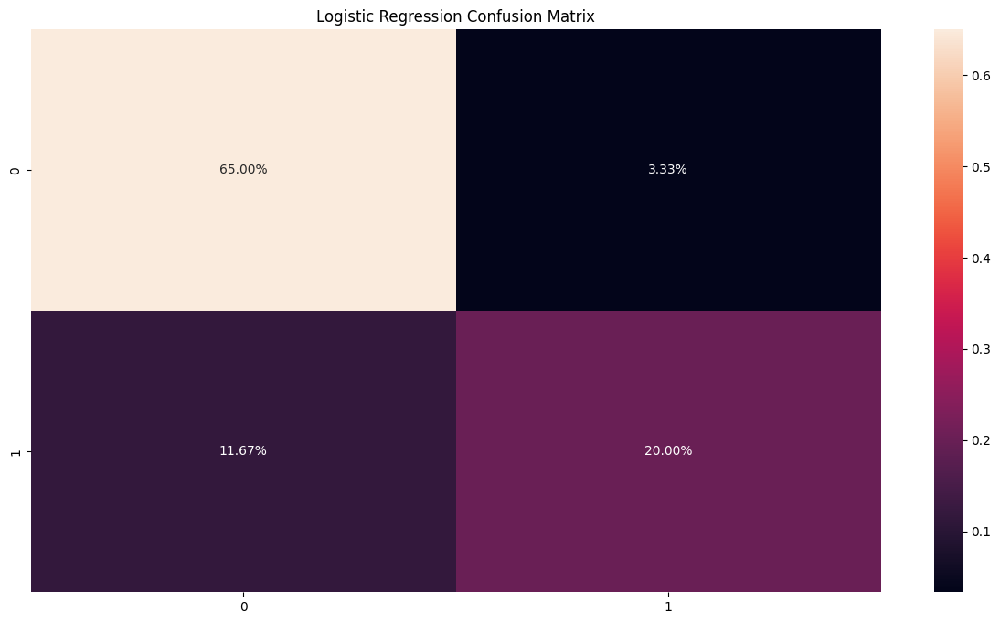

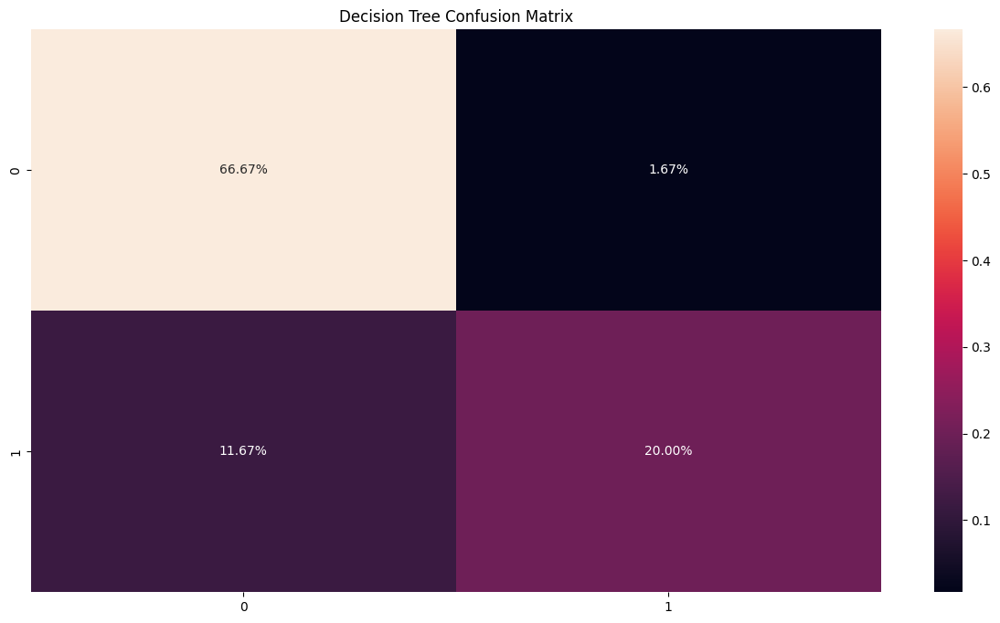

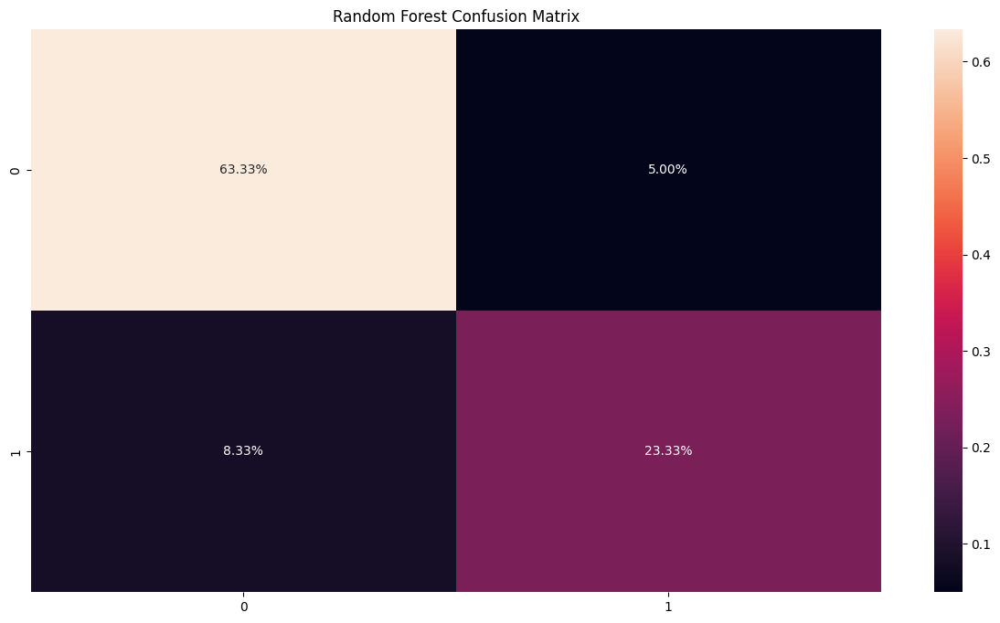

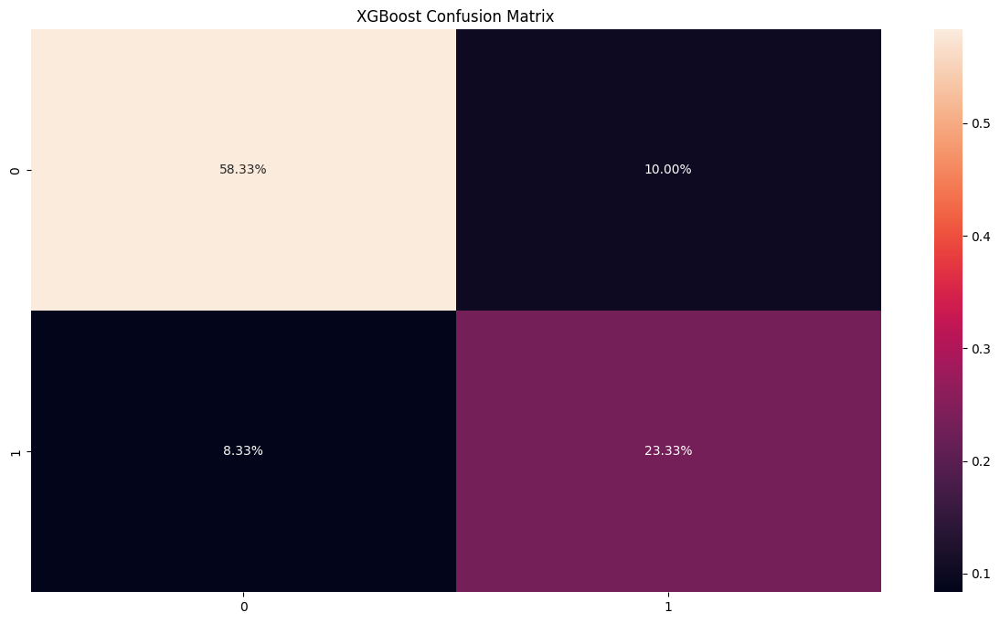

In [49]:
lr_grid_cm = (confusion_matrix(y_test, lr_grid) / confusion_matrix(y_test, lr_grid).astype(float).sum()) * 100
plt.figure(figsize = (15, 8))
plt.title("Logistic Regression Confusion Matrix")
print(sns.heatmap(lr_grid_cm/nm.sum(lr_grid_cm), annot = True, fmt = ".2%"))

dt_grid_cm = (confusion_matrix(y_test, dt_grid) / confusion_matrix(y_test, dt_grid).astype(float).sum()) * 100
plt.figure(figsize = (15, 8))
plt.title("Decision Tree Confusion Matrix")
print(sns.heatmap(dt_grid_cm/nm.sum(dt_grid_cm), annot = True, fmt = ".2%"))

rf_grid_cm = (confusion_matrix(y_test, rf_grid) / confusion_matrix(y_test, rf_grid).astype(float).sum()) * 100
plt.figure(figsize = (15, 8))
plt.title("Random Forest Confusion Matrix")
print(sns.heatmap(rf_grid_cm/nm.sum(rf_grid_cm), annot = True, fmt = ".2%"))

xgb_grid_cm = (confusion_matrix(y_test, xgb_grid) / confusion_matrix(y_test, xgb_grid).astype(float).sum()) * 100
plt.figure(figsize = (15, 8))
plt.title("XGBoost Confusion Matrix")
print(sns.heatmap(xgb_grid_cm/nm.sum(xgb_grid_cm), annot = True, fmt = ".2%"))

#### GridSearch didn't improve my models by much. Only the Decision Tree model improved more than a few percentage points. However, as we can see in the above confusion matrices, none of the models have higher than 65% accuracy in their TPRs.

AUC: 0.9127086007702182


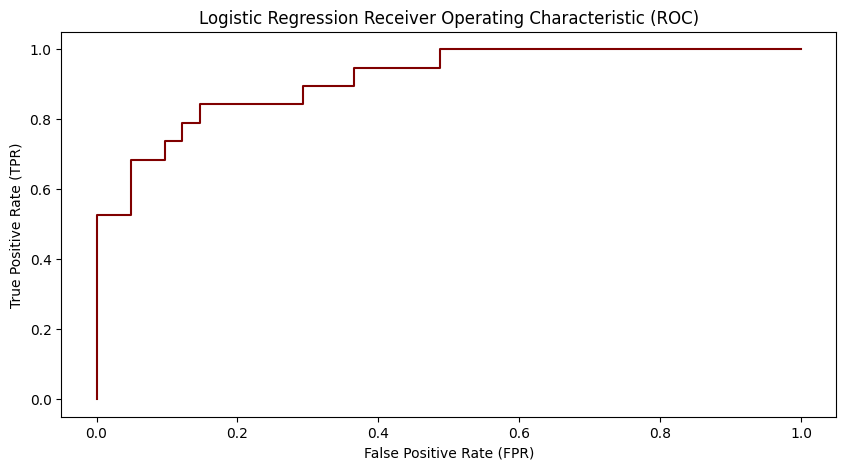

AUC: 0.8498074454428756


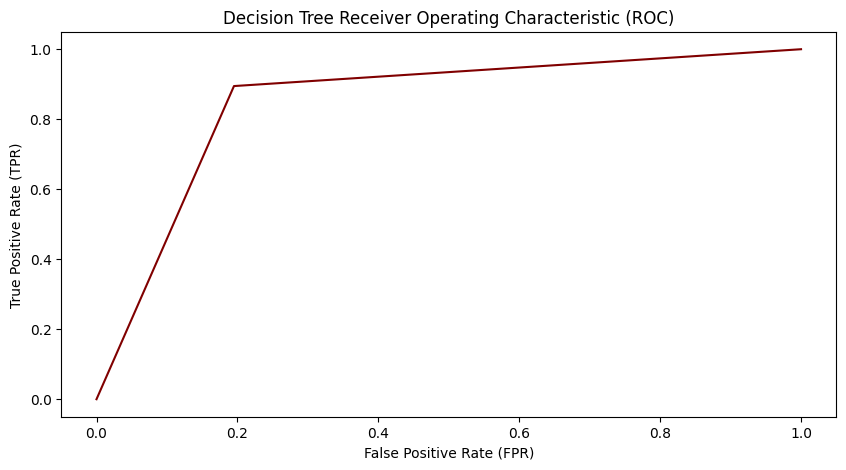

AUC: 0.9313222079589216


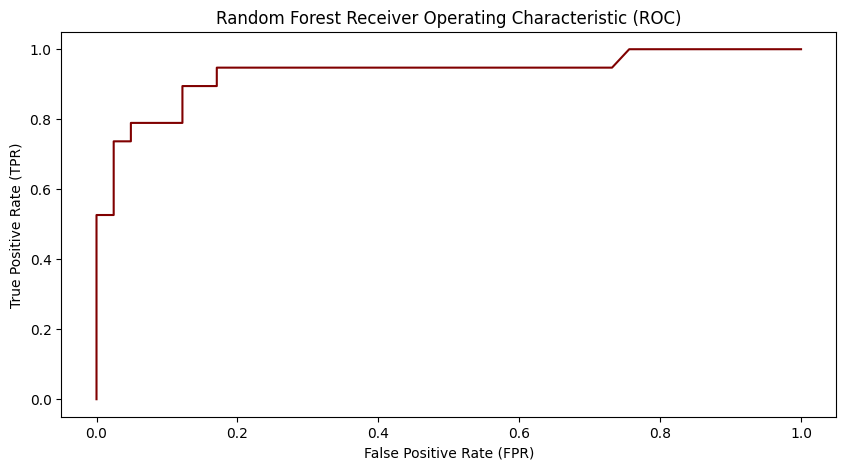

AUC: 0.9178433889602053


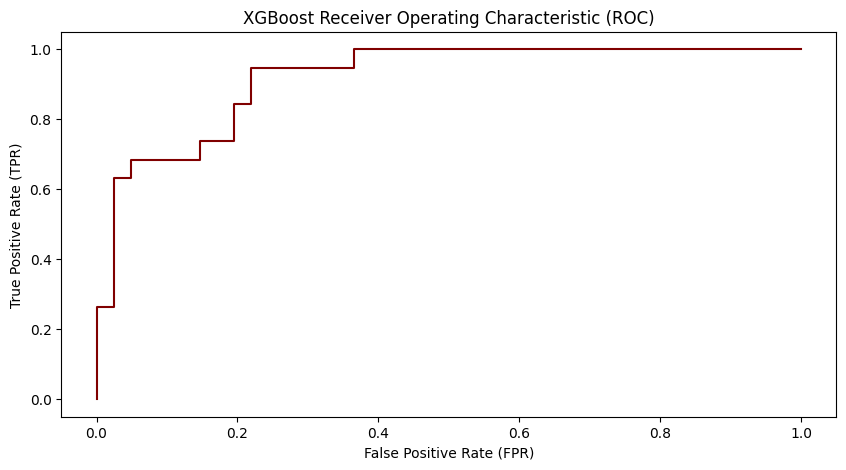

In [50]:
lr_pred = lr.predict_proba(X_test)[::, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, lr_pred)
auc_score = metrics.roc_auc_score(y_test, lr_pred)
print("AUC:", auc_score)
plt.figure(figsize = (10, 5))
plt.plot(fpr, tpr, color = "Maroon")
plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (TPR)")
plt.title("Logistic Regression Receiver Operating Characteristic (ROC)")
plt.rcParams["figure.figsize"] = (2, 1)
plt.show()

dt_pred = dt.predict_proba(X_test)[::, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, dt_pred)
auc_score = metrics.roc_auc_score(y_test, dt_pred)
print("AUC:", auc_score)
plt.figure(figsize = (10, 5))
plt.plot(fpr, tpr, color = "Maroon")
plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (TPR)")
plt.title("Decision Tree Receiver Operating Characteristic (ROC)")
plt.rcParams["figure.figsize"] = (2, 1)
plt.show()

rf_pred = rf.predict_proba(X_test)[::, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, rf_pred)
auc_score = metrics.roc_auc_score(y_test, rf_pred)
print("AUC:", auc_score)
plt.figure(figsize = (10, 5))
plt.plot(fpr, tpr, color = "Maroon")
plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (TPR)")
plt.title("Random Forest Receiver Operating Characteristic (ROC)")
plt.rcParams["figure.figsize"] = (2, 1)
plt.show()

xgb_pred = xgb.predict_proba(X_test)[::, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, xgb_pred)
auc_score = metrics.roc_auc_score(y_test, xgb_pred)
print("AUC:", auc_score)
plt.figure(figsize = (10, 5))
plt.plot(fpr, tpr, color = "Maroon")
plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (TPR)")
plt.title("XGBoost Receiver Operating Characteristic (ROC)")
plt.rcParams["figure.figsize"] = (2, 1)
plt.show()

#### ROC-AUC did improve from 0.85 to 091 for Logistic Regression; from 0.72 to 0.84 for Decision Tree; from 0.89 to 0.93 for Random Forest; and from 0.87 to 0.92 for XGBoost.

In [51]:
import eli5
from eli5 import show_weights, show_prediction

In [52]:
eli5.explain_weights(lr, feature_names = X.columns.tolist())

Weight?,Feature
+0.635,serum_creatinine
+0.450,age
+0.206,creatinine_phosphokinase
+0.105,diabetes
+0.062,anaemia
+0.029,smoking
-0.005,high_blood_pressure
-0.158,platelets
-0.255,sex
-0.371,serum_sodium


In [53]:
eli5.explain_prediction(lr, nm.array(X_test)[-1])

Explanation(estimator='LogisticRegression()', description=None, error=None, method='linear model', is_regression=False, targets=[TargetExplanation(target=0, feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=1.2627223305705115, std=None, value=1.0), FeatureWeight(feature='x8', weight=0.686298335114928, std=None, value=1.8522206320656582), FeatureWeight(feature='x0', weight=0.5882273361517769, std=None, value=-1.306389312247218), FeatureWeight(feature='x7', weight=0.23905038522804395, std=None, value=-0.3762421394218657), FeatureWeight(feature='x9', weight=0.1944823829411747, std=None, value=0.7634012424365331), FeatureWeight(feature='x6', weight=0.18563168690455886, std=None, value=1.1748159664250606), FeatureWeight(feature='x3', weight=0.08977268764540021, std=None, value=-0.8555022255792293), FeatureWeight(feature='x1', weight=0.05459528551896069, std=None, value=-0.885201722519923), FeatureWeight(feature='x10', weight=0.0191886329498404, std=None, value=-0.6631432998565079), FeatureWeight(feature='x2', weight=0.003916437711443567, std=None, value=-0.019008562160251954)], neg=[FeatureWeight(feature='x11', weight=-1.2742500347951649, std=None, value=-0.8872440331692967), FeatureWeight(feature='x4', weight=-0.21271890412968716, std=None, value=-0.24073674849415141), FeatureWeight(feature='x5', weight=-0.003912825738257213, std=None, value=-0.7634012424365332)], pos_remaining=0, neg_remaining=0), proba=0.8621191685810797, score=-1.8330037360735294, weighted_spans=None, heatmap=None)], feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

In [54]:
eli5.explain_prediction(lr, nm.array(X_test)[1])

Explanation(estimator='LogisticRegression()', description=None, error=None, method='linear model', is_regression=False, targets=[TargetExplanation(target=1, feature_weights=FeatureWeights(pos=[FeatureWeight(feature='x11', weight=1.7975566462004575, std=None, value=-1.2516157465764115), FeatureWeight(feature='x0', weight=0.3783115828548018, std=None, value=0.8401891210532244), FeatureWeight(feature='x3', weight=0.12265971183232902, std=None, value=1.168904030989442), FeatureWeight(feature='x6', weight=0.12228941207844266, std=None, value=-0.7739387398249183), FeatureWeight(feature='x10', weight=0.04363442561196584, std=None, value=1.5079696955641135)], neg=[FeatureWeight(feature='<BIAS>', weight=-1.2627223305705115, std=None, value=1.0), FeatureWeight(feature='x4', weight=-0.5404635860480195, std=None, value=0.6116496646925471), FeatureWeight(feature='x8', weight=-0.20197165570803463, std=None, value=0.5450924891610541), FeatureWeight(feature='x9', weight=-0.1944823829411747, std=None, value=0.7634012424365331), FeatureWeight(feature='x7', weight=-0.12514878620590986, std=None, value=-0.19697206102907094), FeatureWeight(feature='x1', weight=-0.05459528551896069, std=None, value=-0.885201722519923), FeatureWeight(feature='x5', weight=-0.006714053255418626, std=None, value=1.3099271319081418), FeatureWeight(feature='x2', weight=-0.00607771284649503, std=None, value=-0.029498383721818396)], pos_remaining=0, neg_remaining=0), proba=0.5180611347151379, score=0.07227598548347225, weighted_spans=None, heatmap=None)], feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

In [55]:
eli5.explain_prediction(lr, nm.array(X_test)[5])

Explanation(estimator='LogisticRegression()', description=None, error=None, method='linear model', is_regression=False, targets=[TargetExplanation(target=1, feature_weights=FeatureWeights(pos=[FeatureWeight(feature='x11', weight=1.8536252117081673, std=None, value=-1.290655573012888), FeatureWeight(feature='x0', weight=1.1515427180600648, std=None, value=2.5574518676935782), FeatureWeight(feature='x8', weight=0.20163391046437656, std=None, value=-0.5441809632594493), FeatureWeight(feature='x3', weight=0.12265971183232902, std=None, value=1.168904030989442), FeatureWeight(feature='x1', weight=0.06967398342419746, std=None, value=1.1296860077873305), FeatureWeight(feature='x6', weight=0.05916558678692735, std=None, value=-0.3744440250436727), FeatureWeight(feature='x5', weight=0.003912825738257213, std=None, value=-0.7634012424365332)], neg=[FeatureWeight(feature='<BIAS>', weight=-1.2627223305705115, std=None, value=1.0), FeatureWeight(feature='x4', weight=-0.9170548311368729, std=None, value=1.0378428712858965), FeatureWeight(feature='x7', weight=-0.23905038522804395, std=None, value=-0.3762421394218657), FeatureWeight(feature='x9', weight=-0.1944823829411747, std=None, value=0.7634012424365331), FeatureWeight(feature='x2', weight=-0.10647876684752208, std=None, value=-0.5167982762636777), FeatureWeight(feature='x10', weight=-0.0191886329498404, std=None, value=-0.6631432998565079)], pos_remaining=0, neg_remaining=0), proba=0.6733193439199405, score=0.723236618340354, weighted_spans=None, heatmap=None)], feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

In [56]:
eli5.show_prediction(lr, X_test[-1], feature_names = list(X.columns), show_feature_values = True)

In [57]:
eli5.show_prediction(lr, X_test[1], feature_names = list(X.columns), show_feature_values = True)

In [58]:
eli5.show_prediction(lr, X_test[5], feature_names = list(X.columns), show_feature_values = True)

### Use 'eli5' for the Decision Tree model.

In [59]:
eli5.explain_weights(dt, feature_names = X.columns.tolist())

Weight,Feature
0.4118,time
0.1578,serum_creatinine
0.0897,ejection_fraction
0.0887,serum_sodium
0.0880,platelets
0.0728,creatinine_phosphokinase
0.0303,age
0.0250,smoking
0.0166,diabetes
0.0096,sex


In [60]:
eli5.explain_prediction(dt, nm.array(X_test)[-1])

Explanation(estimator='DecisionTreeClassifier()', description='\nFeatures with largest coefficients.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble (or a single tree for DecisionTreeClassifier).\nEach node of the tree has an output score, and contribution of a feature\non the decision path is how much the score changes from parent to child.\nWeights of all features sum to the output score or proba of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision path', is_regression=False, targets=[TargetExplanation(target=1, feature_weights=FeatureWeights(pos=[FeatureWeight(feature='x11', weight=0.5199295309403215, std=None, value=-0.8872440331692967), FeatureWeight(feature='<BIAS>', weight=0.32217573221757323, std=None, value=1.0), FeatureWeight(feature='x3', weight=0.06976744186046513, std=None, value=-0.8555022255792293), FeatureWeight(feature='x2', weight=0.0690058479532164, std=None, value=-0.019008562160251954), FeatureWeight(feature='x7', weight=0.019121447028423777, std=None, value=-0.3762421394218657)], neg=[], pos_remaining=0, neg_remaining=0), proba=1.0, score=None, weighted_spans=None, heatmap=None)], feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

In [61]:
eli5.explain_prediction(dt, nm.array(X_test)[1])

Explanation(estimator='DecisionTreeClassifier()', description='\nFeatures with largest coefficients.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble (or a single tree for DecisionTreeClassifier).\nEach node of the tree has an output score, and contribution of a feature\non the decision path is how much the score changes from parent to child.\nWeights of all features sum to the output score or proba of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision path', is_regression=False, targets=[TargetExplanation(target=1, feature_weights=FeatureWeights(pos=[FeatureWeight(feature='x11', weight=0.5199295309403215, std=None, value=-1.2516157465764115), FeatureWeight(feature='<BIAS>', weight=0.32217573221757323, std=None, value=1.0), FeatureWeight(feature='x2', weight=0.20536948431685276, std=None, value=-0.029498383721818396), FeatureWeight(feature='x7', weight=0.019121447028423777, std=None, value=-0.19697206102907094)], neg=[FeatureWeight(feature='x3', weight=-0.06659619450317122, std=None, value=1.168904030989442)], pos_remaining=0, neg_remaining=0), proba=1.0, score=None, weighted_spans=None, heatmap=None)], feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

In [62]:
eli5.explain_prediction(dt, nm.array(X_test)[5])

Explanation(estimator='DecisionTreeClassifier()', description='\nFeatures with largest coefficients.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble (or a single tree for DecisionTreeClassifier).\nEach node of the tree has an output score, and contribution of a feature\non the decision path is how much the score changes from parent to child.\nWeights of all features sum to the output score or proba of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision path', is_regression=False, targets=[TargetExplanation(target=1, feature_weights=FeatureWeights(pos=[FeatureWeight(feature='x11', weight=0.5199295309403215, std=None, value=-1.290655573012888), FeatureWeight(feature='x8', weight=0.41666666666666663, std=None, value=-0.5441809632594493), FeatureWeight(feature='<BIAS>', weight=0.32217573221757323, std=None, value=1.0)], neg=[FeatureWeight(feature='x2', weight=-0.2587719298245613, std=None, value=-0.5167982762636777)], pos_remaining=0, neg_remaining=0), proba=1.0, score=None, weighted_spans=None, heatmap=None)], feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

In [63]:
eli5.show_prediction(dt, X_test[-1], feature_names = list(X.columns), show_feature_values = True)

In [64]:
eli5.show_prediction(dt, X_test[1], feature_names = list(X.columns), show_feature_values = True)

In [65]:
eli5.show_prediction(dt, X_test[5], feature_names = list(X.columns), show_feature_values = True)

### Use LIME to explain both the Random Forest and the XGBoost models.

#### Random Forest

In [66]:
import lime
from lime import lime_tabular

lime_explainer = lime_tabular.LimeTabularExplainer(X_train, mode = "classification", feature_names = list(X.columns))
lime_explainer

In [67]:
hfd1 = heart_failure_data.copy()

X1 = hfd1.drop(columns = ["DEATH_EVENT"])
y1 = hfd1["DEATH_EVENT"]

X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size = 0.20, random_state = 0)

In [68]:
exp = lime_explainer.explain_instance(data_row = X1_train.iloc[-1,:].values,
                                 predict_fn = rf.predict_proba,
                                 num_features = len(X1_train.columns)
                                )

exp.show_in_notebook(show_table = True, show_all = True)
exp.save_to_file("lime_tabular.html")

In [69]:
exp = lime_explainer.explain_instance(data_row = X1_train.iloc[1,:].values,
                                 predict_fn = rf.predict_proba,
                                 num_features = len(X1_train.columns)
                                )

exp.show_in_notebook(show_table = True, show_all = True)
exp.save_to_file("lime_tabular.html")

In [70]:
exp = lime_explainer.explain_instance(data_row = X1_train.iloc[5,:].values,
                                 predict_fn = rf.predict_proba,
                                 num_features = len(X1_train.columns)
                                )

exp.show_in_notebook(show_table = True, show_all = True)
exp.save_to_file("lime_tabular.html")

In [71]:
print("Test R^2 Score: ", rf.score(X1_test, y1_test))
print("Train R^2 Score: ", rf.score(X1_train, y1_train))

Test R^2 Score:  0.6166666666666667
Train R^2 Score:  0.698744769874477


#### XGBoost

In [72]:
exp = lime_explainer.explain_instance(data_row = X1_train.iloc[-1,:].values,
                                 predict_fn = xgb.predict_proba,
                                 num_features = len(X1_train.columns)
                                )

exp.show_in_notebook(show_table = True, show_all = True)
exp.save_to_file("lime_tabular.html")

In [73]:
exp = lime_explainer.explain_instance(data_row = X1_train.iloc[1,:].values,
                                 predict_fn = xgb.predict_proba,
                                 num_features = len(X1_train.columns)
                                )

exp.show_in_notebook(show_table = True, show_all = True)
exp.save_to_file("lime_tabular.html")

In [74]:
exp = lime_explainer.explain_instance(data_row = X1_train.iloc[5,:].values,
                                 predict_fn = xgb.predict_proba,
                                 num_features = len(X1_train.columns)
                                )

exp.show_in_notebook(show_table = True, show_all = True)
exp.save_to_file("lime_tabular.html")

In [75]:
print("Test R^2 Score  : ", xgb.score(X1_test, y1_test))
print("Train R^2 Score : ", xgb.score(X1_train, y1_train))

Test R^2 Score  :  0.6166666666666667
Train R^2 Score :  0.694560669456067


### Using SHAP, specifically, the TreeExplainer method with ‘force_plot’

In [76]:
import shap

shap_explainer = shap.TreeExplainer(xgb)
shap_values = shap_explainer.shap_values(X1_train)

In [77]:
shap_values
shap_explainer.expected_value

-0.83659494

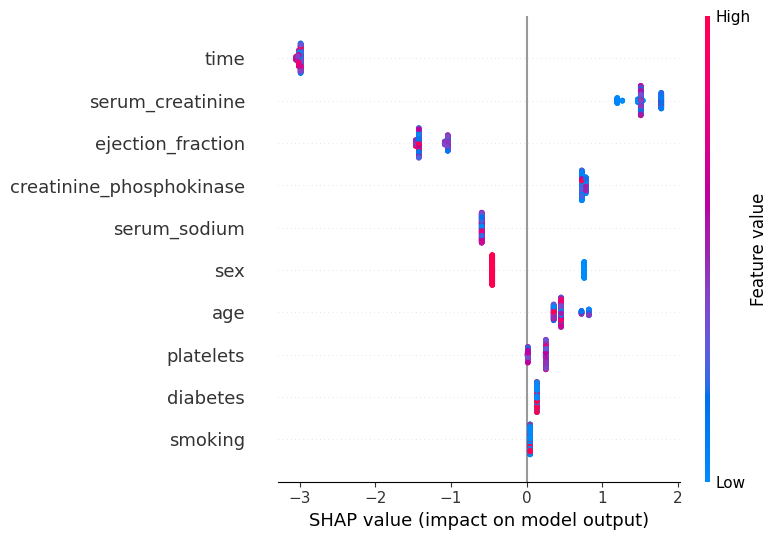

In [78]:
shap.summary_plot(shap_values, features = X1_train, max_display = 10)

In [79]:
shap.initjs()
shap.force_plot(shap_explainer.expected_value, shap_values[1,:], features = X1_train.iloc[1, :])

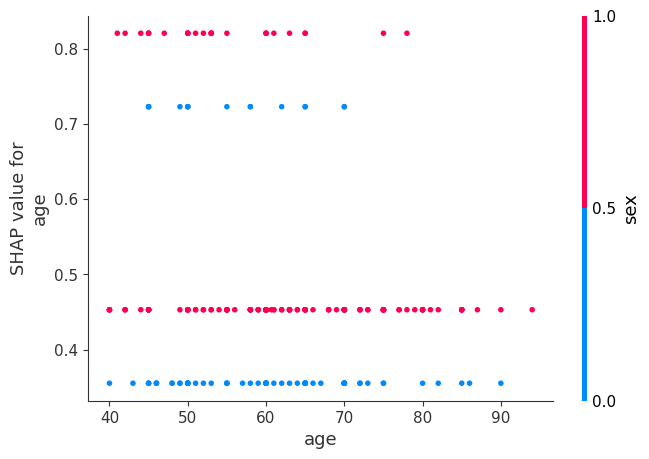

In [80]:
shap.dependence_plot("age", shap_values, X1_train)

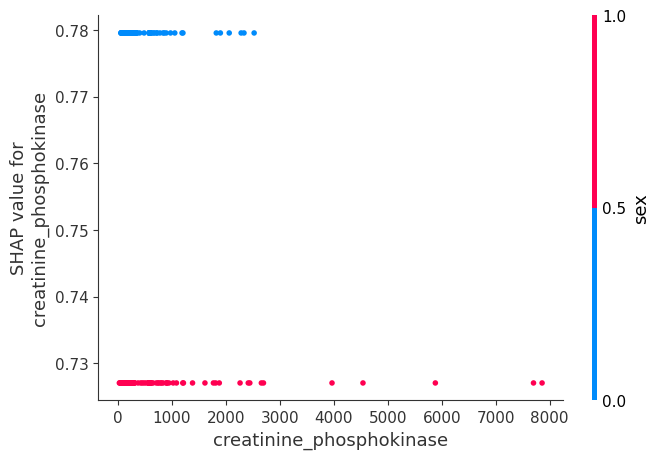

In [81]:
shap.dependence_plot("creatinine_phosphokinase", shap_values, X1_train)

### Predict observations, one for positive and one for negative label, by using all four (4) models.

### Logistic Regression (LR)

In [82]:
print(lr.predict_proba(X1_test.iloc[:3,:]))

[[1. 0.]
 [1. 0.]
 [1. 0.]]


### Decision Tree (DT)

In [83]:
print(dt.predict_proba(X1_test.iloc[:3,:]))

[[1. 0.]
 [1. 0.]
 [1. 0.]]


### Random Forest (RF)

In [84]:
print(rf.predict_proba(X1_test.iloc[:3,:]))

[[0.55 0.45]
 [0.51 0.49]
 [0.56 0.44]]


### XGBoost (XGB)

In [85]:
print(xgb.predict_proba(X1_test.iloc[:3,:]))

[[0.84127355 0.15872642]
 [0.83852494 0.16147508]
 [0.9611078  0.03889219]]
